In [1]:
from ml_dl_experiments import settings, show_image_from_source

# Альтернативные архитектуры моделей детекции.


**Рассмотрим следующие подходы:**

1. Двустадийные архитектуры Fast R-CNN и Faster R-CNN — усовершенствованные модификации R-CNN. Это «тяжёлая артиллерия» мира детекторов, многолетний эталон максимальной точности.
    
2. Однопроходные детекторы anchor-free, к которым относится и YOLOv8 (наконец-то мы до неё доберёмся).

## R-CNN

Вот схема работы алгоритма R-CNN:

1. **Поиск регионов:** внешний алгоритм (Selective Search) находил на изображении ~2000 потенциально интересных прямоугольных регионов.
    
2. **Изменение размера:** каждый из этих ~2000 регионов «вырезался» и принудительно деформировался до фиксированного размера (например, 227x227).
    
3. **Классификация:** каждый из ~2000 деформированных регионов подавался в нейросеть (CNN) для извлечения признаков и последующей классификации с помощью SVM.
    
4. **Уточнение:** отдельный регрессор немного корректировал границы рамок.

### Поиск регионов

В этом алгоритме стал камнем преткновения производительности.


**Selective Search** — это «жадный» иерархический алгоритм. Он работает снизу-вверх (от маленьких регионов к большим) в несколько этапов: 

1. Изображение разбивается на множество маленьких начальных регионов с помощью быстрого алгоритма графовой сегментации (например, алгоритма Фельценшвальба). Изображение превращается в «мозаику» из небольших, неровных сегментов, пиксели внутри которых похожи друг на друга по цвету или текстуре.

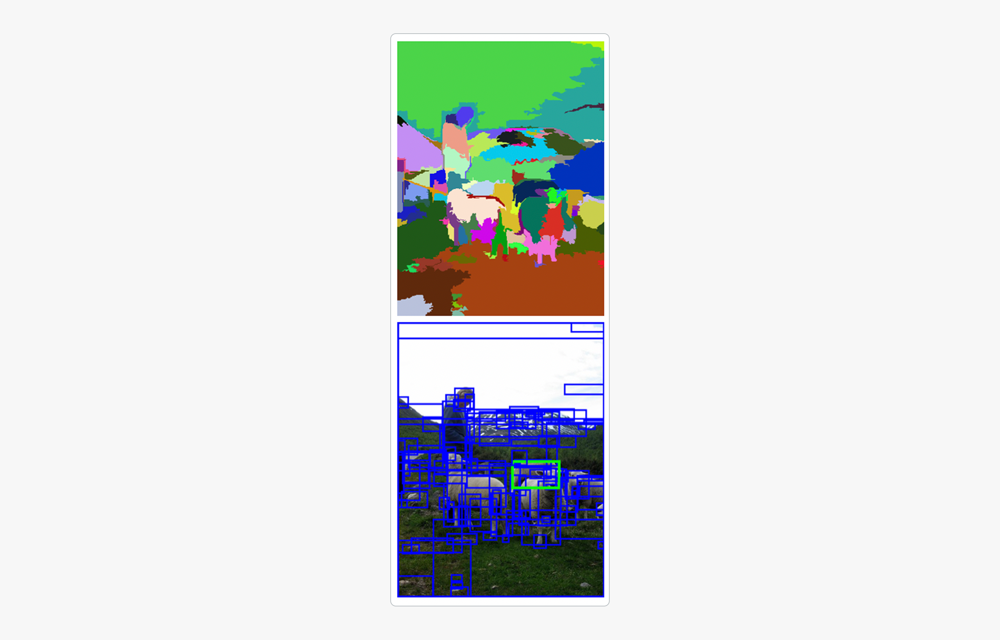

In [2]:
source: str = "ml_dl/cv/selective_search1.png"
show_image_from_source(source, width=600)

2. Алгоритм объединяет регионы на основе сходства регионов по цвету, размеру и текстуре. Подобную процедуру он проделывает несколько раз.
    
3. Алгоритм ограничивает минимальной прямоугольной рамкой (bounding box) каждый регион, который когда-либо существовал в начале, середине или финале этого иерархического процесса. В конце этого иерархического процесса мы получаем тысячи рамок разного размера, которые соответствуют всем возможным группировкам пикселей на изображении.

Алгоритм R-CNN почти на треть повысил качество по сравнению с существовавшим SOTA-решением, но был страшно медлительным: 43 секунды на кадр на CPU и 13 секунд на кадр на GPU! Именно поэтому в будущих версиях решили упирать на скорость.

## Fast R-CNN

Общая идея решения такова: пропускать через CNN-сеть не каждый регион, который получили с помощью Selective Search, а всё изображение целиком и вырезать нужные регионы на более поздних слоях.

**Нулевой шаг. Генерация регионов-кандидатов**

Запускается внешний алгоритм Selective Search, который генерирует около 2000 регионов-кандидатов (Region of Interest, RoI). Этот процесс — «бутылочное горлышко» алгоритма, так как он не связан с нейросетью. Fast R-CNN не решает эту проблему, но решает проблему медленной обработки уже найденных регионов.

**Первый шаг. Извлечение карты признаков (feature map)**

Входное изображение размером 224x224 проходит через базовую свёрточную нейросеть (например, VGG16 или ResNet). Оно не добирается до конца сети (классификатора), а останавливается за последним свёрточным слоем. На выходе мы получаем карту признаков (feature map) — многомерный тензор (например, размером 14x14x512), который содержит обобщённую информацию о формах, текстурах и паттернах на всём изображении.

**Второй шаг. Проецирование регионов на карту признаков**

Координаты каждого региона-кандидата проецируются на карту признаков. Так как карта признаков меньше исходного изображения (из-за операций max-pooling в CNN), координаты нужно масштабировать. В итоге для каждого кандидата мы получаем соответствующую ему область на карте признаков.

Пример проекции — на изображении ниже. Помните, что на самом деле это должно быть не настоящее изображение машины, а абстрактная карта признаков размером 14×14×512, соответствующая изображению.

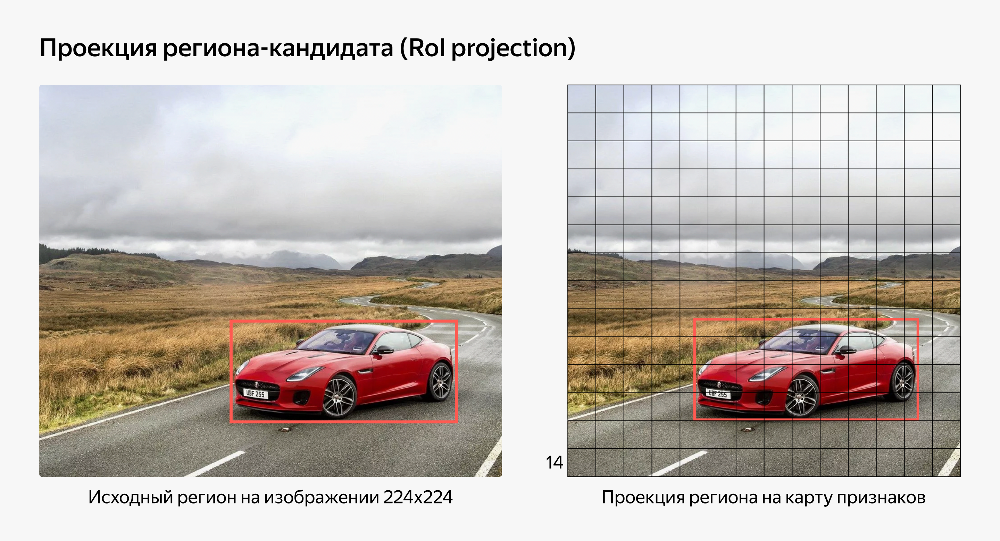

In [3]:
show_image_from_source("ml_dl/cv/frcnn1.png", width=700)

Размеры спроецированных регионов-областей на карте признаков разные, потому что исходные регионы-кандидаты тоже были разного размера. А следующие слои сети должны требовать на вход вектор фиксированной длины, чтобы в итоге получить предсказание как класса, так и координат бокса.

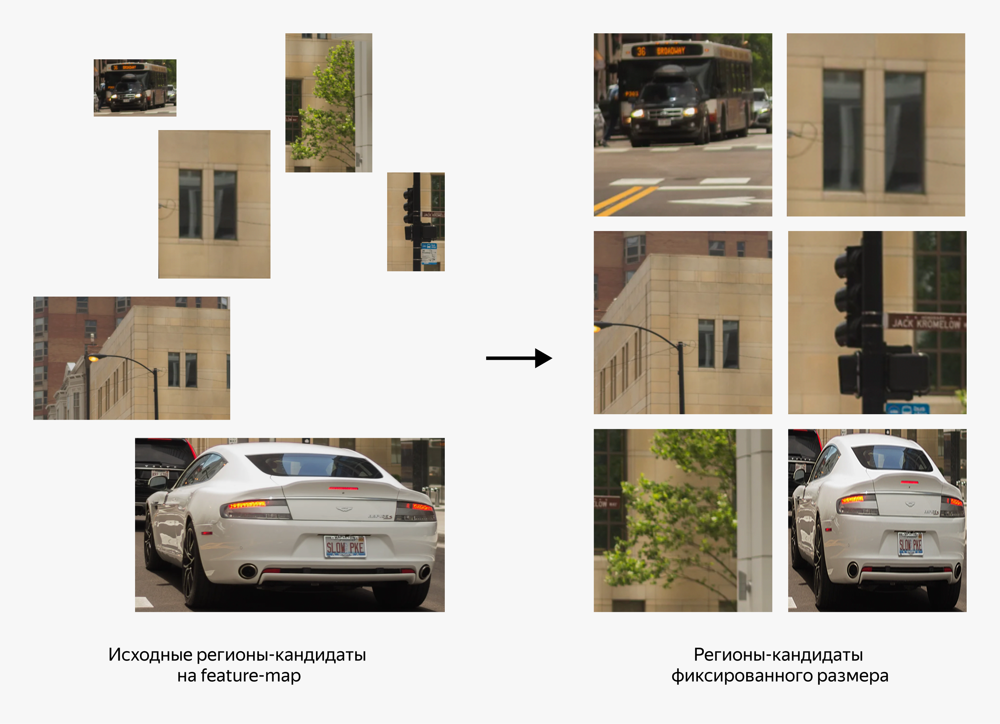

In [4]:
show_image_from_source("ml_dl/cv/frcnn2.png", width=800)

**Третий шаг. Слой RoI Pooling**

Слой RoI Pooling (Region of Interest Pooling) решает проблему разных размеров. Он берёт спроецированный регион-кандидат размера H x W (это по-прежнему тензор размера H x W x 512, где 1 <= H <= 14, 1 <= W <= 14, так как регионы выбирались на feature-map размером 14 x 14 x 512). Далее этот регион покрывается сеткой размером 7x7. Внутри каждой из 49 ячеек мы находим максимальное значение активации, а на выходе получаем тензор фиксированного размера.

Простой пример:

Представьте, что из карты признаков был выделен регион-кандидат (RoI) размером 4x4. Нам нужно применить к нему RoI Pooling, чтобы получить тензор фиксированного размера 2x2.

Исходный регион выглядит следующим образом:
```py
[[1, 3, 8, 2],
 [2, 9, 1, 5],
 [6, 4, 2, 7],
 [5, 1, 3, 4]]
```

Мы получим следующий тензор:
```py
[
    [9, 8],
    [6, 7]
]
```

**Четвёртый шаг. Классификация и уточнение рамки (Bounding Box Regression)**

Фиксированный вектор признаков «выпрямляется» (flatten) в один длинный вектор, который подаётся на вход нескольким полносвязным слоям (fully connected layers). Затем сеть разветвляется на две головы (heads), работающие параллельно:

- Голова классификации (Classifier): слой SoftMax, который предсказывает класс объекта внутри региона. Он выдаёт вероятности для каждого класса и специальный класс «фон» (background).
    
- Голова регрессии рамки (Bounding Box Regressor): линейный слой, который предсказывает 4 значения (dx, dy, dw, dh). Это не сами координаты рамки, а поправки к координатам исходного региона-кандидата. Это позволяет точнее подогнать рамку под реальные границы объекта.

Итоговую архитектуру можно увидеть на изображении ниже:

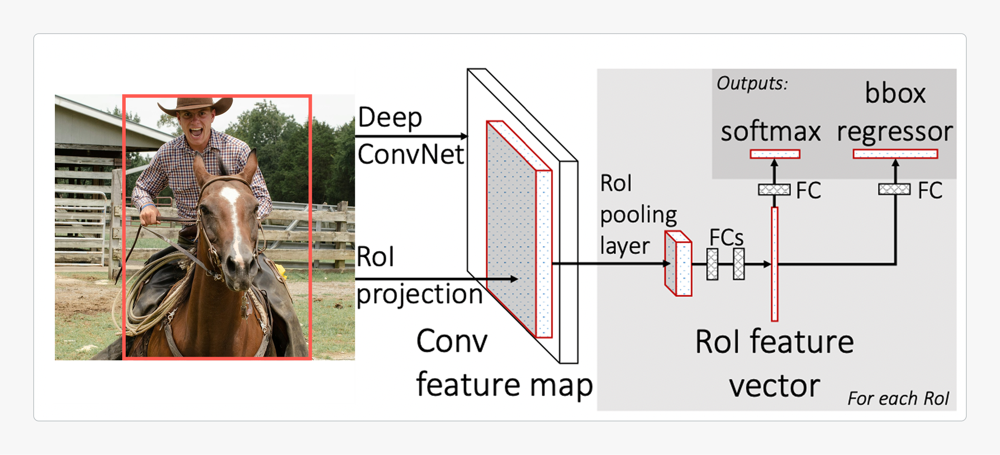

In [5]:
show_image_from_source("ml_dl/cv/frcnn3.png", width=800)

### Функция потерь (multi_task_loss)

У сети две задачи: правильно классифицировать объект и точно настроить его рамку. Поэтому используется комбинированная функция потерь (multi-task loss):

$$
L(p, u, t^u, v) = L_{cls}(p,u) + \lambda L_{loc}(t^u, v)
$$

Здесь:

- $u$ — ground truth-класс для bounding box. Если u = 0, класс является фоном;
- $v=(v_1,v_2,v_3,v_4)$ — ground truth-поправки координат рамки;
- $t^u=(t_1,t_2,t_3,t_4)$ — предсказанные поправки для bounding box.

Посмотрим на каждую часть функции потерь:
$$
L_{cls}(p,u)=−log⁡(p_u),
$$
где:
- $p_u$−предсказанная вероятность для истинного класса.

$$
L_{loc}(t^u,v)=\sum_{i=1}^4smooth_{L1}(t_i−v_i)
$$

В последней формуле считается сумма разностей между предсказанным и истинным смещением рамки. Вместо обычной разницы используется smooth, поскольку L2 (MSE) очень чувствительна к большим отклонениям (выбросам), что может привести к нестабильности обучения. А L1 менее чувствительна к выбросам, но её градиент постоянен, что может замедлить обучение в области малых отклонений. Smooth сочетает преимущества обеих.

Первая функция непрерывна при вероятности, стремящейся к нулю она стремительно возрастает:

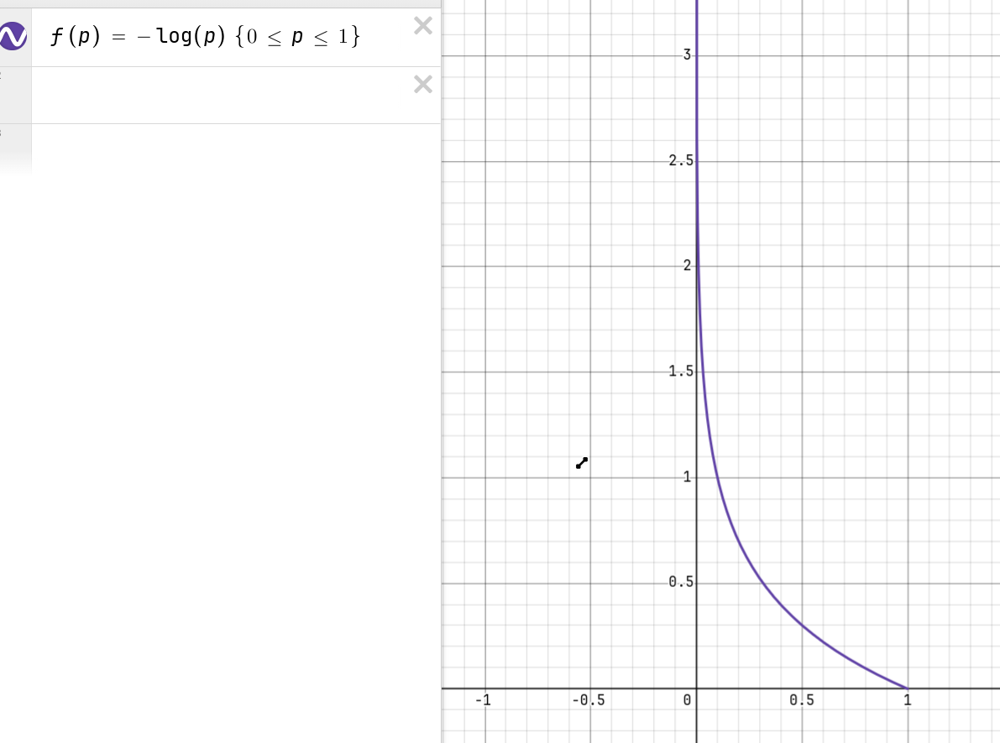

Кратко вспомним о второй функции:

Функция **Smooth L1** (также известная как **Huber loss**) — это функция потерь, используемая в задачах регрессии. Она сочетает в себе лучшие свойства **L1-потери** (модуль разности) и **L2-потери** (квадрат разности), чтобы быть **устойчивой к выбросам**, но при этом **гладкой и дифференцируемой** везде.

---

**🔑 Ключевая идея**

- При **малых ошибках** (близких к нулю) функция ведёт себя как **L2** (квадратичная):  
  → гладкая, хорошо дифференцируется, способствует быстрой сходимости.
  
- При **больших ошибках** (выбросах) она переходит к **L1** (линейной):  
  → менее чувствительна к большим отклонениям, чем L2 (которая резко "наказывает" за большие ошибки).

Таким образом, **Smooth L1 — это компромисс между устойчивостью и эффективностью оптимизации**.

---

**📐 Математическое определение**

Для разности $ r = y_{\text{pred}} - y_{\text{true}} $ и порога $ \delta > 0 $ (часто берут $ \delta = 1 $):

$$
\text{Smooth}_{L1}(r) =
\begin{cases}
\frac{1}{2} r^2, & \text{если } |r| \leq \delta \\
\delta \cdot (|r| - \frac{1}{2} \delta), & \text{иначе}
\end{cases}
$$

При $ \delta = 1 $ это упрощается до:

$$
\text{Smooth}_{L1}(r) =
\begin{cases}
\frac{1}{2} r^2, & |r| \leq 1 \\
|r| - \frac{1}{2}, & |r| > 1
\end{cases}
$$

---

**🧠 Почему это полезно?**

- **L2 (MSE)**: сильно штрафует большие ошибки → модель может "перенастроиться" под выбросы.
- **L1 (MAE)**: устойчива к выбросам, но недифференцируема в нуле → хуже сходится градиентными методами.
- **Smooth L1**: гладкая везде (включая ноль), дифференцируема, и не "взрывается" на выбросах.

---

**📌 Где применяется?**

- В задачах **обнаружения объектов** (например, в YOLO, Faster R-CNN) — для регрессии координат bounding box'ов.
- В **робастной регрессии**.
- Везде, где нужен баланс между точностью и устойчивостью.

---

Если кратко:  
> **Smooth L1 — это "мягкий", дифференцируемый аналог MAE, который ведёт себя как MSE около нуля и как MAE вдали от него.**

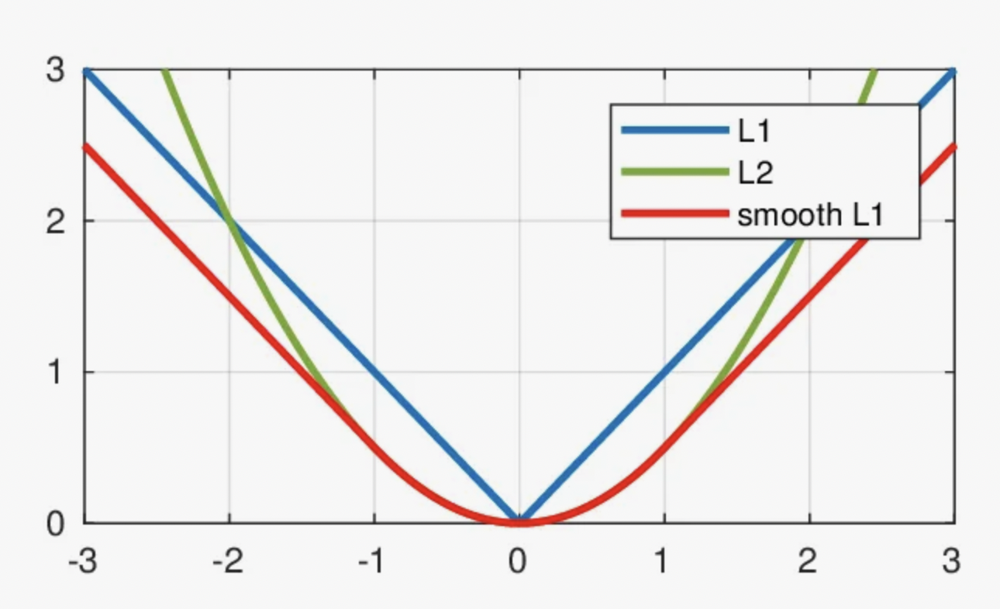

In [7]:
show_image_from_source("ml_dl/cv/frcnn4.png", width=600)

### Дополнительные улучшения. SVD

В архитектуре Fast R-CNN (как в VGG16 и других сетях того времени) после свёрточных слоёв и RoI Pooling идут несколько полносвязных слоёв (fully connected, FC) c огромным количеством параметров — эти слои вычислительно тяжёлые.

Вычисления на fc слоях занимет в среднем 45% всего времени вычислений модели, поэтому было принято решение ускорить вычисления в этом месте.

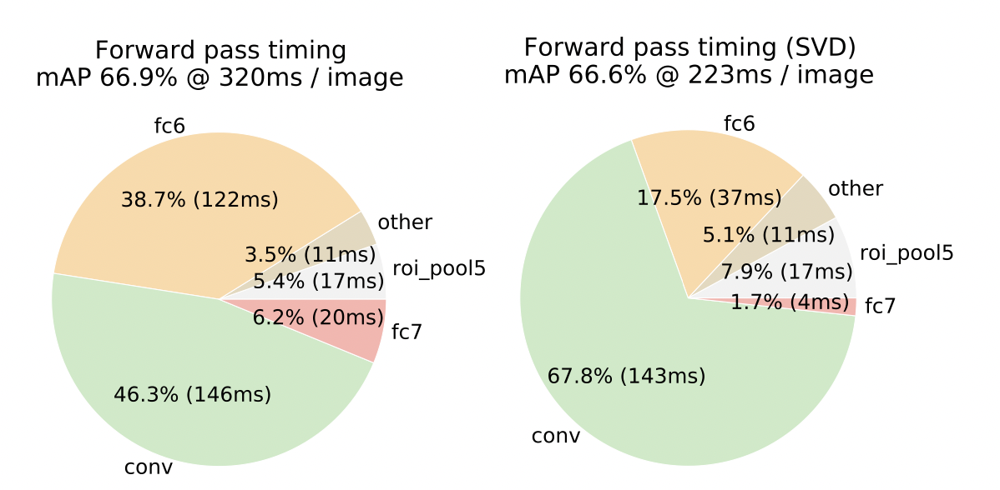

In [9]:
show_image_from_source("ml_dl/cv/frcnn5.png", width=600)

Для сжатия и ускорения именно этих громоздких FC-слоёв автор предложил использовать:

**SVD (Singular Value Decomposition)** — метод линейной алгебры, который позволяет разложить любую матрицу W на три другие, более простые и фундаментальные матрицы:
$$
W=USV^T,
$$
где:

- $W$ — исходная матрица размера m x n;
- $U$ — матрица левых сингулярных векторов размером m x m (нас не интересует).
- $V$ — матрица правых сингулярных векторов размером n x n (нас не интересует).
- $S$ — матрица сингулярных чисел размером m x n — самая важная часть. Это диагональная матрица, которая отвечает за масштабирование (растяжение). На её диагонали расположены сингулярные числа (σ₁, σ₂, σ₃, ...), отсортированные по убыванию.
$$
\begin{pmatrix}
\sigma_{1} & 0 & 0 & ... \\
0 & \sigma_{2} & 0 & ... \\
0 & 0 & \sigma_{3} & ... \\
... & ... & ... & ...
\end{pmatrix}
$$

Каждое сингулярное число показывает «важность» или «энергию» соответствующего ему направления из матриц U и V. Самое большое число σ₁ соответствует самому главному преобразованию, которое выполняет матрица A. Самые маленькие числа соответствуют незначительным деталям. Размер m x n.
Поскольку сингулярные числа в Σ отсортированы по важности, можно выбросить самые меньшие из них, которые несут мало информации.
Если оставить только t самых больших сингулярных чисел и соответствующие им векторы в U и V, то:
$$
W≈U_tS_tV_t^T
$$

где:

- $U_t$ — первые t столбцов из U;

- $S_t$ — верхний левый t x t блок из S;

- $V_t$ᵀ — первые t строк из Vᵀ.

За счёт этого мы можем ускорить работу FC-слоёв. Если применить SVD к обученной матрице весов W одного из FC-слоёв, получим:
$$
W=USV^T
$$

Оставляем только t самых значимых сингулярных чисел. Чем меньше t, тем больше сжатие и ускорение, но и больше потеря точности:
$$
W≈U_tS_tV_t^T
$$

Исходное преобразование y = Wx для FC-слоя теперь можно представить как последовательность двух операций:
$$
y=W_x≈U_tS_tV_t^Tx=U_tS_t(V_t^Tx)
$$


Как это ускорит вычисление на нашем примере:

Мы уже знаем, что матрица весов для одного из FC-слоёв имеет размерность 25088x4096, или 102 млн параметров. Зафиксируем t=1024 (как в оригинальной статье) и посмотрим, сколько обучаемых параметров получится:

- Размер матрицы $V_t$ — 1024×4096.
    
- Размер матрицы $U_t * S_t$ — 25088×1024.

Тогда суммарное количество параметров по ним равно: 1024×4096 + 25088×1024 = 1024×(4096+25088) ~ 30 млн!

Таким образом, мы можем уменьшить количество вычисляемых параметров в 4 раза и почти не потерять в точности. Стоит учитывать, что чем больше t, тем больше сэкономим параметров, но и больше потеряем в точности.

Fast R-CNN оказался в разы быстрее и даже точнее своего предшественника R-CNN. Но у нейросетей оставалось очень болезненная проблема: алгоритм Selective Search работал на CPU, занимал значительное время (около 2 с на изображение) и замедлял весь процесс. Эту проблему и решил следующий этап эволюции — Faster R-CNN.

## Faster R-CNN

На момент написания статьи “Faster R-CNN: Towards Real-Time Object Detection with Region Proposal Networks“ в 2015 году вышла достойная замена Selective Search под названием Edge Boxes.

Суть метода Edge Boxes заключается в следующем:

1. Сначала алгоритм находит все контуры и границы на изображении.
    
2. Вместо перебора всех возможных рамок алгоритм смотрит небольшие группы границ и использует их для генерации рамок-кандидатов. Для каждой сгенерированной рамки быстро вычисляется оценка качества:
    - Плюс — за каждую частичку контура, которая лежит полностью внутри рамки.
    - Минус — за каждую частичку контура, которая пересекает границу рамки.
3. Рамки, набравшие наивысший балл, сортируются, и лучшие из них выдаются как регионы-кандидаты.

Данный алгоритм оказался быстрее чем Selective Search во много раз, однако проблема скорости все еще оставалась. - Не решена проблема поиска рамок-кандидатов, который будет занимать половину работы сети.

Решение нашли.

**Region Proposal Network (RPN)** — сети для генерации регионов, которая интегрирована в основную модель и работает на GPU.

Концептуально архитектура Fast R-CNN практически полностью повторилась в Faster R-CNN за исключением того, что Selective Search заменили на RPN.

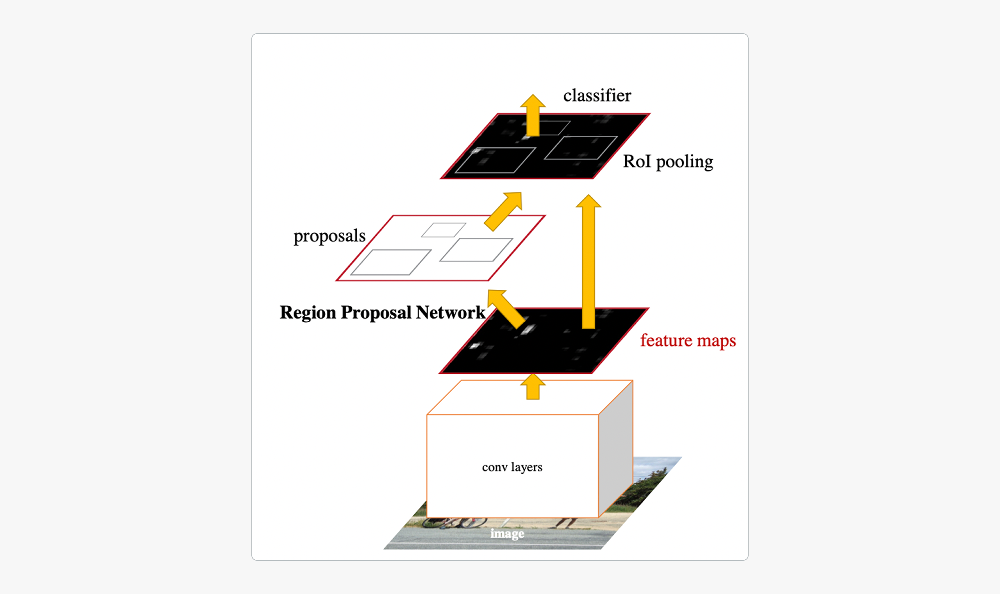

In [10]:
show_image_from_source("ml_dl/cv/rpn1.png", width=600)

**Первый шаг. Извлечение карты признаков**

На этом шаге всё осталось без изменений. Мы по-прежнему не доводим изображение до конца сети (до классификатора), а останавливаемся за последним свёрточным слоем. На выходе получаем карту признаков (feature map) размером 14x14x512. 

**Второй шаг. Region Proposal Network (RPN)**

На этом этапе генерируются регионы-кандидаты. 

По всей карте признаков движется небольшое скользящее окно размером 3x3. В каждой позиции этого окна RPN не просто предлагает один регион, а рассматривает k заранее определённых шаблонов рамок. Эти шаблоны называются якорями (anchor boxes), (похожая техника использовалась в архитектурах YOLOv4–YOLOv5, о которых мы говорили в прошлом модуле).

Якоря — это набор рамок с разными масштабами (размерами) и соотношениями сторон (широкие, высокие, квадратные). Например, в оригинальной статье использовалось 9 якорей (3 масштаба × 3 соотношения сторон).

Взгляните на таблицу ниже: anchor scales и aspect ratios являются инструкциями для генерации этих 9 якорей:

- **aspect ratios [1:1, 2:1, 1:2]** задают три базовые формы якорей относительно их центра. Соотношение 1:1 создаёт квадратный якорь, 1:2 — высокий вертикальный якорь, 2:1 — широкий горизонтальный якорь.
    
- **anchor scales** задают три базовых размера. В контексте Faster R-CNN это не просто пиксели, а множители, которые применяются к базовому шагу сети (stride). Если stride равен 16 (как у VGG16), то базовые якоря будут иметь площади, соответствующие квадратам (128x128, 256x256, 512x512).

Перемножив эти параметры (3 соотношения сторон × 3 масштаба), мы и получаем те самые 9 уникальных якорей-шаблонов, которые RPN примеряет в каждой точке карты признаков.

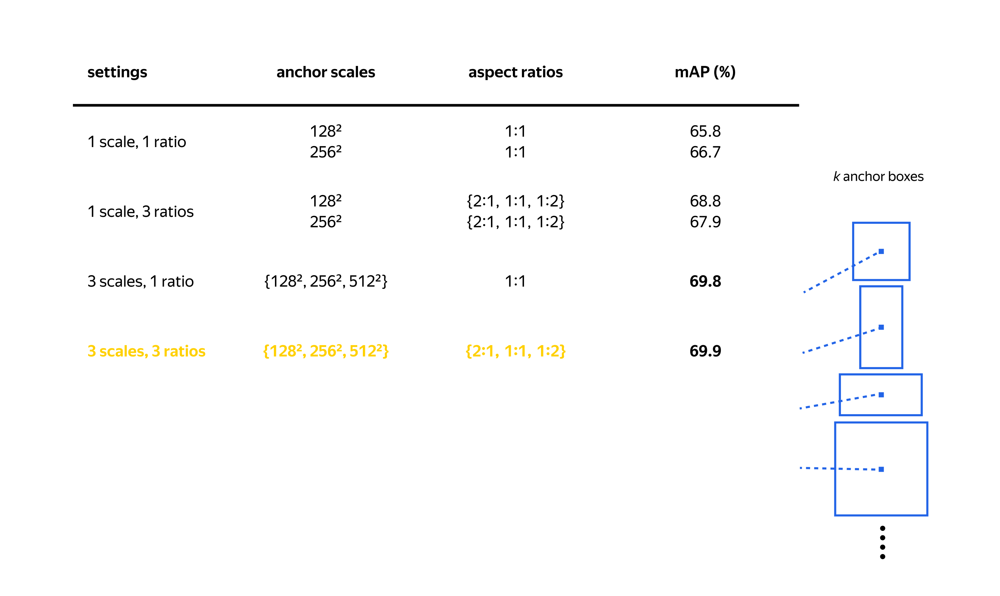

In [11]:
show_image_from_source("ml_dl/cv/rpn2.png", width=600)

Такая методика была выбрана, поскольку в любой части изображения объект может быть большим, маленьким, вытянутым по вертикали или горизонтали. 

Как это работает?

Сперва к нашей карте признаков размера 14x14x512 применяется свёртка 3x3. Затем карта признаков раздваивается:

- К первой карте признаков применяется свёртка 1x1 с глубиной k*2, и на выходе получается тензор размером 14x14x(k*2). k*2 кодирует для каждого якоря два числа: вероятность объектности (objectness) и вероятность фона. Это и есть выход головы классификации (Classification Head).
    
- Ко второй карте признаков применяется свёртка 1x1 с глубиной k*4, и на выходе получается тензор размером 14x14x(k*4). k*4 кодирует для каждого якоря четыре числа: dx, dy, dw, dh — поправки для координат и размеров якоря. dx, dy — предсказания, как подвинуть соответствующий якорь. dw, dh — предсказания, как изменить масштаб якоря. Это и есть выход головы регрессии (Regression Head).

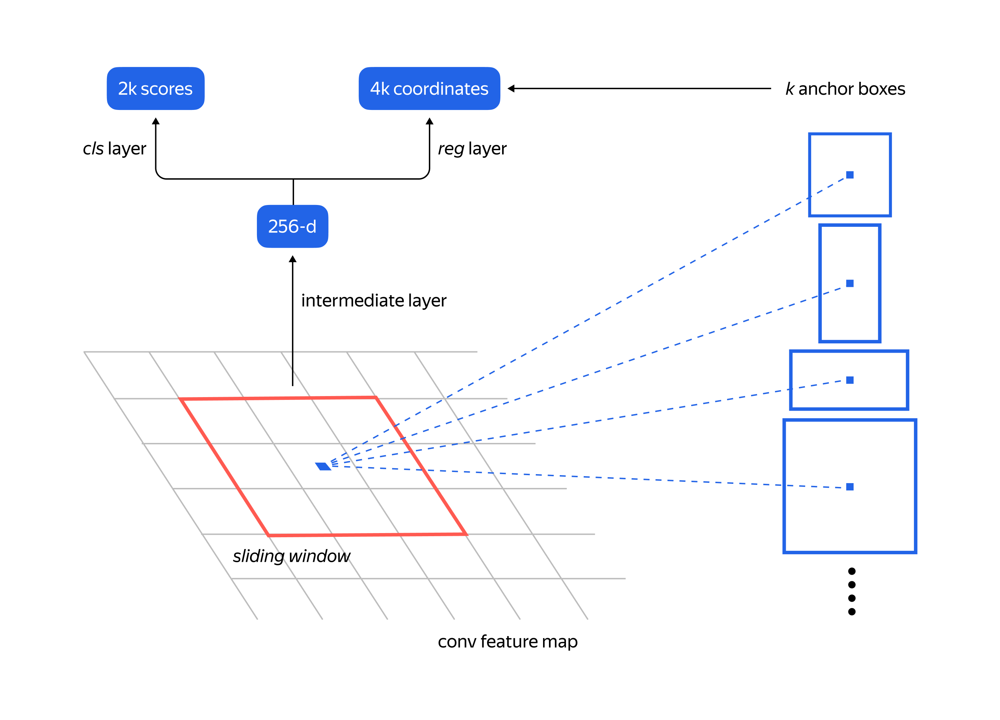

In [12]:
show_image_from_source("ml_dl/cv/rpn3.png", width=800)

После этого шага у нас есть огромное количество предложенных регионов с их оценками объектности. Чтобы передать дальше только самые качественные, применяется постобработка:

1. Отбрасываются регионы, выходящие за границы изображения.
2. Применяется Non-Maximum Suppression (NMS): если несколько рамок с высокими оценками указывают на один и тот же объект, NMS оставляет только одну — с самой высокой оценкой, а остальные удаляет.
3. В итоге RPN выдаёт ~300-2000 перспективных регионов-кандидатов (RoI) для следующего этапа. 

R-CNN тоже брал ~2000 регионов из исходного изображения и каждый из них по отдельности прогонял через CNN. 

Но Faster R-CNN выполняет дорогую операцию свёртки всего один раз на всё изображение целиком, поэтому большое количество регионов в этом случае нас не пугает.


**Третий шаг. RoI pooling**

Шаг такой же, как у Fast R-CNN, но теперь RoI pooling получает рамки не от Selective Search, а от RPN.

**Четвёртый шаг. Классификация и уточнение рамки**

Так же, как и в Fast R-CNN, выходной вектор из RoI pooling подаётся на вход нескольким полносвязным слоям (Fully Connected layers), а затем сеть разветвляется на две головы и делает предсказания.

**О якорях в данной ситуации:**

1. Якоря — это набор предопределённых шаблонных рамок с разными масштабами и соотношениями сторон.

Именно этот набор шаблонов позволяет модели быть готовой к встрече с объектами разной формы и размера, не пытаясь изобрести рамку с нуля для каждого случая.

2. Вместо предсказания координат с нуля RPN предсказывает поправки (dx, dy, dw, dh) к якорям.

Предсказание этих поправок — и есть задача головы регрессии в RPN.

3. Использование якорей позволяет сети эффективно обнаруживать объекты разной формы (например, широкие и высокие) в одной и той же области изображения.

Наличие в наборе якорей разной формы заранее вооружает модель, делая её готовой к встрече с объектами различной геометрии.

Кратко по архитектуре:

Извлекает из исходного изображения глубокие, информативные признаки:
1. Backbone — это свёрточная нейросеть (например, VGG или ResNet), которая принимает на вход исходное изображение и преобразует его в набор карт признаков разного уровня.
***
С помощью карты признаков быстро генерирует сотни регионов-кандидатов, которые с высокой вероятностью содержат объекты:

2. RPN — это небольшая нейросеть, которая скользит по карте признаков, полученной от Backbone. В каждой позиции она использует набор якорей разного размера и формы. После фильтрации и NMS, RPN выдаёт список регионов-кандидатов.
***
Принимает каждый предложенный регион и выполняет для него финальную классификацию и уточнение координат рамки:

3. Detection Head. Голова детектора берёт каждый регион-кандидат (RoI), предложенный RPN, и с помощью слоя RoI Pooling преобразует его в вектор признаков фиксированного размера. Затем этот вектор подаётся на два параллельных полносвязных слоя: один для многоклассовой классификации и второй для регрессии.

### Функция потерь (loss)

Поскольку голов теперь 4 (по две у RPN и у детектора), у сети есть 4 типа потерь (loss):

1. RPN Classification Loss показывает, насколько хорошо RPN отличает объект от фона.
2. RPN Regression Loss показывает, насколько точно RPN подгоняет якоря к объектам.
3. Detector Classification Loss показывает, насколько хорошо финальный детектор определяет класс объекта.
4. Detector Regression Loss показывает, насколько точно финальный детектор уточняет рамку.

Все эти потери суммируются в одну общую функцию потерь, и вся сеть обучается как единое целое (end-to-end). Это позволяет RPN учиться предлагать именно те регионы, которые удобны для финального детектора.

$$
L(p_i​,t_i​,p,u,t^u,v)=L_{RPN​}({p_i​},{t_i​})+L_{FastR−CNN​}(p,u,t^u,v)
$$
Функцию потерь для Fast R-CNN мы уже разбирали, поэтому остановимся подробнее на $L_{RPN}$:
$$
L_{RPN}({p_i},{t_i})=\frac{1}{N_{cls}}\sum_i L_{cls}(p_i,p_i^{∗})+\frac{1}{N_{reg}}\sum_i p_i^{∗}L_{reg}(t_i,t_i^{∗})
$$

- $i$ — индекс якоря в мини-батче;
- $p_i$ — предсказанная вероятность того, что якорь i является объектом;
- $p_i^*$ — истинная метка для якоря i. Она равна 1, если якорь позитивный (содержит объект), и 0, если негативный (фон);
- $t_i$ — предсказанный вектор из 4 поправок для якоря i;
- $t_i^*$ — истинный вектор поправок для якоря i.

Первое слагаемое Log Loss — для бинарной классификации (объект/фон):
$$
L_{cls}(p_i,p_i^∗)=−[p_i^∗log(p_i)+(1−p_i^∗)log(1−p_i)]
$$
Второе слагаемое — потеря регрессии RPN:
$$
p_i∗L_{reg}(t_i,t_i^∗)p_i∗​L_{reg​}(t_i​,t_i^∗​)
$$
$L_{reg}$ — это Smooth L1 Loss между предсказанными и истинными поправками.
Ключевой момент — умножение на $p_i^∗$. Это означает, что регрессионная потеря вычисляется только для позитивных якорей (когда $p_i^∗=1$). Для негативных якорей (фона) эта часть потери равна нулю, так как нет смысла уточнять рамку для пустого места.

Также в функции потерь используется нормализация и балансировка:

- $N_{reg}$ — нормализационный коэффициент для регрессии (обычно количество якорей, ~2400);
- $N_{cls}$ — нормализационный коэффициент для классификации (обычно размер мини-батча, например, 256).

# Anchor-free архитектуры: CornerNet и FCOS

## CornerNet